In [1]:
# Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from scipy.cluster.hierarchy import dendrogram, linkage

import warnings
warnings.filterwarnings('ignore')

# Configuración de visualización
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette('husl')
%matplotlib inline

## 1. Carga y Preparación de Datos

In [3]:
# Cargar datos procesados (auto-build si faltan)
from pathlib import Path
import pandas as pd
import numpy as np

root = Path('..')
features_path = root / 'data' / '05_model_input' / 'unsupervised_features.csv'
labels_path = root / 'data' / '05_model_input' / 'cluster_labels.csv'
model_input_path = root / 'data' / '05_model_input' / 'model_input.csv'

# Construir features si no existen
if not features_path.exists():
    src_candidates = [
        model_input_path,
        root / 'data' / '03_primary' / 'full_dataset.csv'
    ]
    src_path = next((p for p in src_candidates if p.exists()), None)
    if src_path is None:
        raise FileNotFoundError('No source dataset found to build unsupervised_features.csv')
    df_src = pd.read_csv(src_path)

    # columnas numéricas candidatas
    num_cols = [c for c in [
        'delivery_time','delivery_delay','price','shipping_charges',
        'order_year','order_month','customer_zip_code_prefix'
    ] if c in df_src.columns]
    # columnas categóricas candidatas
    cat_cols = [c for c in ['customer_state'] if c in df_src.columns]

    # casting y imputación
    for c in num_cols:
        df_src[c] = pd.to_numeric(df_src[c], errors='coerce')
    df_src[num_cols] = df_src[num_cols].fillna(df_src[num_cols].median(numeric_only=True))

    # one-hot para cat
    if cat_cols:
        df_cat = pd.get_dummies(df_src[cat_cols].fillna('unknown'), prefix=cat_cols)
        features_df = pd.concat([df_src[num_cols], df_cat], axis=1)
    else:
        features_df = df_src[num_cols]

    features_path.parent.mkdir(parents=True, exist_ok=True)
    features_df.to_csv(features_path, index=True)
    print(f"✓ Built unsupervised features from {src_path.name} → {features_path} | shape={features_df.shape}")

# cargar archivos
features = pd.read_csv(features_path, index_col=0)
cluster_labels = pd.read_csv(labels_path, index_col=0) if labels_path.exists() else pd.DataFrame()
model_input = pd.read_csv(model_input_path) if model_input_path.exists() else pd.DataFrame()

print(f"Features shape: {features.shape}")
print(f"Cluster labels shape: {cluster_labels.shape}")
print(f"\nPrimeras columnas de features: {features.columns[:10].tolist()}")
print(f"\nColumnas de cluster_labels: {cluster_labels.columns.tolist() if not cluster_labels.empty else '[]'}")

✓ Built unsupervised features from model_input.csv → ..\data\05_model_input\unsupervised_features.csv | shape=(87422, 1)
Features shape: (87422, 1)
Cluster labels shape: (0, 0)

Primeras columnas de features: ['delivery_delay']

Columnas de cluster_labels: []


## 2. Clustering Analysis

### 2.1 Elbow Method para KMeans

In [6]:
# Cargar datos de elbow (auto-build si faltan)
elbow_path = Path('../data/07_model_output/clustering_elbow.csv')
if not elbow_path.exists():
    # Construir métricas de elbow a partir de 'features'
    if 'features' not in globals() or features.empty:
        raise FileNotFoundError("Elbow data missing and 'features' dataframe is empty or undefined.")
    ks = list(range(2, min(12, max(3, len(features)//100))))  # rango razonable basado en tamaño
    inertias = []
    X = features.values
    for k in ks:
        km = KMeans(n_clusters=k, random_state=42, n_init='auto')
        km.fit(X)
        inertias.append(km.inertia_)
    elbow_df = pd.DataFrame({'k': ks, 'inertia': inertias})
    elbow_path.parent.mkdir(parents=True, exist_ok=True)
    elbow_df.to_csv(elbow_path, index=False)
    print(f"✓ Built elbow data → {elbow_path} | ks={ks}")
else:
    print(f"✓ Loaded elbow data from {elbow_path}")

elbow_data = pd.read_csv(elbow_path)

# Visualización interactiva del elbow
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=elbow_data['k'], 
    y=elbow_data['inertia'],
    mode='lines+markers',
    marker=dict(size=10, color='blue'),
    line=dict(width=3)
))

fig.update_layout(
    title='Elbow Method - Optimal K Selection',
    xaxis_title='Number of Clusters (k)',
    yaxis_title='Inertia (Within-cluster sum of squares)',
    template='plotly_white',
    width=800,
    height=500
)

fig.show()

print("\n📊 Elbow Analysis:")
print(elbow_data)

✓ Built elbow data → ..\data\07_model_output\clustering_elbow.csv | ks=[2, 3, 4, 5, 6, 7, 8, 9, 10, 11]



📊 Elbow Analysis:
    k       inertia
0   2  4.737762e+06
1   3  3.095695e+06
2   4  2.218493e+06
3   5  1.597013e+06
4   6  1.206729e+06
5   7  9.023553e+05
6   8  7.272907e+05
7   9  5.403904e+05
8  10  4.658823e+05
9  11  3.935321e+05


### 2.2 Métricas de Clustering

In [10]:
# Cargar métricas (auto-build si faltan) con muestreo para evitar sobrecarga de memoria
metrics_path = Path('../data/07_model_output/clustering_metrics.csv')
if not metrics_path.exists():
    if 'features' not in globals() or features.empty:
        raise FileNotFoundError("Clustering metrics missing and 'features' is empty or undefined.")

    # Base matrix de features (downcast a float32 para reducir memoria)
    X_metrics = features.values.astype(np.float32, copy=False)

    # Tamaños de muestra para métricas/algoritmos pesados
    metrics_sample_size = int(min(10000, len(X_metrics)))
    algo_sample_size = int(min(5000, len(X_metrics)))  # para Agglomerative/DBSCAN
    rng = np.random.RandomState(42)
    idx_metrics = rng.choice(len(X_metrics), size=metrics_sample_size, replace=False) if len(X_metrics) > metrics_sample_size else np.arange(len(X_metrics))
    idx_algo = rng.choice(len(X_metrics), size=algo_sample_size, replace=False) if len(X_metrics) > algo_sample_size else np.arange(len(X_metrics))
    X_metrics_sample = X_metrics[idx_metrics]
    X_algo_sample = X_metrics[idx_algo]

    # Seleccionar k óptimo a partir de elbow_data si está disponible
    if 'elbow_data' in globals() and not elbow_data.empty:
        drops = elbow_data['inertia'].pct_change().abs()
        k_opt_idx = drops[1:].idxmax()
        k_opt = int(elbow_data.loc[k_opt_idx, 'k'])
    else:
        k_opt = max(2, min(8, max(2, len(X_metrics) // 100)))

    results = []

    # KMeans (entrena sobre todo el conjunto, métricas de silueta en muestra)
    try:
        km = KMeans(n_clusters=k_opt, random_state=42, n_init='auto')
        labels_km = km.fit_predict(X_metrics)
        results.append({
            'algorithm': 'KMeans',
            'silhouette': silhouette_score(X_metrics, labels_km, sample_size=metrics_sample_size, random_state=42),
            'davies_bouldin': davies_bouldin_score(X_metrics, labels_km),
            'calinski_harabasz': calinski_harabasz_score(X_metrics, labels_km)
        })
    except Exception as e:
        print(f"⚠️ KMeans failed: {e}")

    # Agglomerative (entrena y evalúa en muestra para evitar O(n^2))
    try:
        agg = AgglomerativeClustering(n_clusters=k_opt)
        labels_agg = agg.fit_predict(X_algo_sample)
        results.append({
            'algorithm': 'Agglomerative',
            'silhouette': silhouette_score(X_algo_sample, labels_agg, sample_size=min(2000, len(X_algo_sample)), random_state=42),
            'davies_bouldin': davies_bouldin_score(X_algo_sample, labels_agg),
            'calinski_harabasz': calinski_harabasz_score(X_algo_sample, labels_agg)
        })
    except Exception as e:
        print(f"⚠️ Agglomerative failed: {e}")

    # Gaussian Mixture (entrena en muestra por robustez; evalúa métricas con las etiquetas sobre la muestra)
    try:
        gm = GaussianMixture(n_components=k_opt, random_state=42)
        gm.fit(X_metrics_sample)
        labels_gm = gm.predict(X_metrics_sample)
        results.append({
            'algorithm': 'GaussianMixture',
            'silhouette': silhouette_score(X_metrics_sample, labels_gm, sample_size=min(5000, len(X_metrics_sample)), random_state=42),
            'davies_bouldin': davies_bouldin_score(X_metrics_sample, labels_gm),
            'calinski_harabasz': calinski_harabasz_score(X_metrics_sample, labels_gm)
        })
    except Exception as e:
        print(f"⚠️ GaussianMixture failed: {e}")

    # DBSCAN (entrena y evalúa en muestra)
    try:
        db = DBSCAN(eps=0.5, min_samples=10)
        labels_db = db.fit_predict(X_algo_sample)
        unique_clusters = np.unique(labels_db)
        if len(unique_clusters) >= 2 and np.any(labels_db != -1):
            results.append({
                'algorithm': 'DBSCAN',
                'silhouette': silhouette_score(X_algo_sample, labels_db, sample_size=min(5000, len(X_algo_sample)), random_state=42),
                'davies_bouldin': davies_bouldin_score(X_algo_sample, labels_db),
                'calinski_harabasz': calinski_harabasz_score(X_algo_sample, labels_db)
            })
        else:
            print("⚠️ DBSCAN no generó clusters válidos para calcular métricas (en muestra).")
    except Exception as e:
        print(f"⚠️ DBSCAN failed: {e}")

    metrics = pd.DataFrame(results)
    metrics_path.parent.mkdir(parents=True, exist_ok=True)
    metrics.to_csv(metrics_path, index=False)
    print(f"✓ Built clustering metrics → {metrics_path}")
else:
    metrics = pd.read_csv(metrics_path)

print("\n🎯 Clustering Metrics Comparison:")
print("="*80)
display(metrics.round(4))

# Visualización de métricas
fig = make_subplots(
    rows=1, cols=3,
    subplot_titles=('Silhouette Score', 'Davies-Bouldin Index', 'Calinski-Harabasz Score')
)

colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

for i, metric in enumerate(['silhouette', 'davies_bouldin', 'calinski_harabasz']):
    fig.add_trace(
        go.Bar(x=metrics['algorithm'], y=metrics[metric], marker_color=colors[i], showlegend=False),
        row=1, col=i+1
    )

fig.update_layout(height=400, showlegend=False, template='plotly_white')
fig.show()

# Interpretación
best_silhouette = metrics.loc[metrics['silhouette'].idxmax()]
print(f"\n✅ Mejor algoritmo por Silhouette Score: {best_silhouette['algorithm']} ({best_silhouette['silhouette']:.4f})")
print("   - Valores cercanos a 1 indican clusters bien separados")
print("   - Valores cercanos a 0 indican clusters superpuestos")


🎯 Clustering Metrics Comparison:


,algorithm,silhouette,davies_bouldin,calinski_harabasz
0,KMeans,0.5085,0.6166,80700.8104
1,GaussianMixture,0.4892,2.9758,21300.5073
2,DBSCAN,0.9959,5.9978,8299.6196



✅ Mejor algoritmo por Silhouette Score: DBSCAN (0.9959)
   - Valores cercanos a 1 indican clusters bien separados
   - Valores cercanos a 0 indican clusters superpuestos


### 2.3 Distribución de Clusters

✓ Saved cluster labels to ..\data\05_model_input\cluster_labels.csv


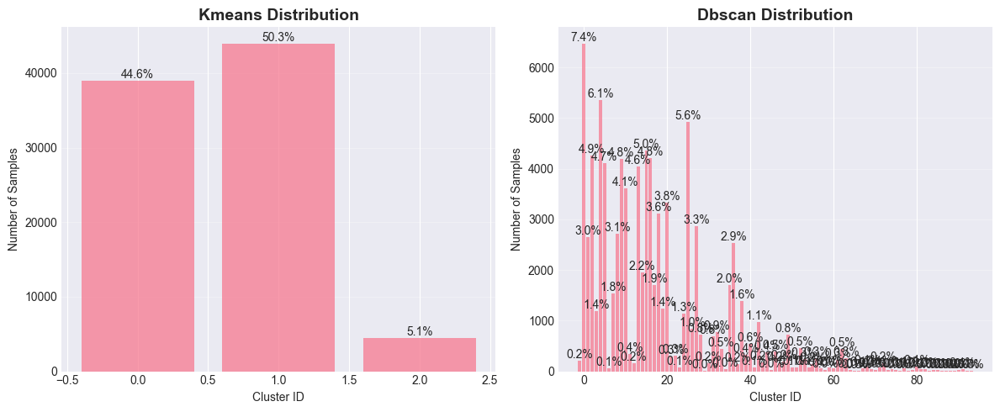


📊 Cluster Distribution Statistics:

KMEANS:
  Cluster 1: 43,959 samples (50.28%)
  Cluster 0: 39,009 samples (44.62%)
  Cluster 2: 4,454 samples (5.09%)

DBSCAN:
  Cluster 0: 6,470 samples (7.40%)
  Cluster 4: 5,356 samples (6.13%)
  Cluster 25: 4,927 samples (5.64%)
  Cluster 15: 4,351 samples (4.98%)
  Cluster 2: 4,267 samples (4.88%)
  Cluster 16: 4,203 samples (4.81%)
  Cluster 9: 4,197 samples (4.80%)
  Cluster 5: 4,115 samples (4.71%)
  Cluster 13: 4,051 samples (4.63%)
  Cluster 10: 3,618 samples (4.14%)
  Cluster 20: 3,334 samples (3.81%)
  Cluster 18: 3,121 samples (3.57%)
  Cluster 27: 2,871 samples (3.28%)
  Cluster 8: 2,715 samples (3.11%)
  Cluster 1: 2,643 samples (3.02%)
  Cluster 36: 2,540 samples (2.91%)
  Cluster 14: 1,956 samples (2.24%)
  Cluster 35: 1,708 samples (1.95%)
  Cluster 17: 1,695 samples (1.94%)
  Cluster 7: 1,530 samples (1.75%)
  Cluster 38: 1,387 samples (1.59%)
  Cluster 19: 1,234 samples (1.41%)
  Cluster 3: 1,185 samples (1.36%)
  Cluster 24: 1,13

In [13]:
# Análisis de distribución

# Asegurar que 'cluster_labels' tenga columnas válidas (auto-build si faltan)
if 'cluster_labels' not in globals() or cluster_labels.empty or 'kmeans_label' not in cluster_labels.columns:
    # construir con labels existentes en memoria si están completos
    df_labels = pd.DataFrame(index=features.index)

    # KMeans (preferir labels existentes)
    if 'labels_km' in globals() and isinstance(labels_km, np.ndarray) and len(labels_km) == len(features):
        df_labels['kmeans_label'] = pd.Series(labels_km, index=features.index)
    else:
        # fallback: recomputar KMeans rápido
        k_for_build = int(globals().get('k_opt', 3))
        km_build = KMeans(n_clusters=k_for_build, random_state=42, n_init='auto')
        df_labels['kmeans_label'] = km_build.fit_predict(features.values)

    # DBSCAN si los labels coinciden en longitud
    if 'labels_db' in globals() and isinstance(labels_db, np.ndarray) and len(labels_db) == len(features):
        df_labels['dbscan_label'] = pd.Series(labels_db, index=features.index)

    # Agglomerative si los labels coinciden en longitud
    if 'labels_agg' in globals() and isinstance(labels_agg, np.ndarray) and len(labels_agg) == len(features):
        df_labels['agglomerative_label'] = pd.Series(labels_agg, index=features.index)

    cluster_labels = df_labels

    # Persistir si hay ruta disponible
    if 'labels_path' in globals() and isinstance(labels_path, Path):
        try:
            cluster_labels.to_csv(labels_path)
            print(f"✓ Saved cluster labels to {labels_path}")
        except Exception as e:
            print(f"⚠️ Could not save cluster labels: {e}")

# Columnas disponibles para graficar
plot_cols = [c for c in ['kmeans_label', 'dbscan_label', 'agglomerative_label'] if c in cluster_labels.columns]

if not plot_cols:
    print("⚠️ No cluster label columns available to plot.")
else:
    fig, axes = plt.subplots(1, len(plot_cols), figsize=(6 * len(plot_cols), 5))
    if len(plot_cols) == 1:
        axes = [axes]

    for i, col in enumerate(plot_cols):
        cluster_counts = cluster_labels[col].value_counts().sort_index()
        axes[i].bar(cluster_counts.index, cluster_counts.values, alpha=0.7)
        axes[i].set_title(f'{col.replace("_label", "").title()} Distribution', fontsize=14, fontweight="bold")
        axes[i].set_xlabel('Cluster ID')
        axes[i].set_ylabel('Number of Samples')
        axes[i].grid(axis='y', alpha=0.3)

        # Agregar porcentajes
        total = int(cluster_counts.sum())
        for idx, val in zip(cluster_counts.index, cluster_counts.values):
            pct = 100 * val / max(total, 1)
            axes[i].text(idx, val, f'{pct:.1f}%', ha='center', va='bottom', fontsize=10)

    plt.tight_layout()
    plt.show()

    # Estadísticas
    print("\n📊 Cluster Distribution Statistics:")
    for col in plot_cols:
        print(f"\n{col.replace('_label', '').upper()}:")
        counts = cluster_labels[col].value_counts()
        total = int(counts.sum())
        for cluster_id, count in counts.items():
            pct = 100 * count / max(total, 1)
            print(f"  Cluster {cluster_id}: {count:,} samples ({pct:.2f}%)")

## 3. Reducción de Dimensionalidad y Visualización

### 3.1 PCA Analysis

In [15]:
# Cargar o construir embeddings y varianza de PCA si faltan
report_dir = Path('../data/08_reports')
pca_embed_path = report_dir / 'pca_embedding.csv'
pca_var_path = report_dir / 'pca_explained_variance.csv'

if not pca_embed_path.exists() or not pca_var_path.exists():
    if 'features' not in globals() or features.empty:
        raise FileNotFoundError("Missing PCA files and 'features' dataframe is empty or undefined.")

    # Estandarizar y calcular PCA (hasta 2 componentes; si solo hay 1 feature, crear pca_2=0 para el scatter)
    X_pca_src = features.values.astype(np.float32, copy=False)
    scaler = StandardScaler()
    X_pca = scaler.fit_transform(X_pca_src)

    n_comp = max(1, min(2, X_pca.shape[1]))
    pca = PCA(n_components=n_comp, random_state=42)
    Z = pca.fit_transform(X_pca)

    pca_df = pd.DataFrame(Z, columns=[f'pca_{i+1}' for i in range(n_comp)], index=features.index)
    if 'pca_2' not in pca_df.columns:
        pca_df['pca_2'] = 0.0  # asegurar 2D para la gráfica

    # Adjuntar etiqueta de KMeans para colorear
    if 'cluster_labels' in globals() and not cluster_labels.empty and 'kmeans_label' in cluster_labels.columns:
        pca_df['kmeans_label'] = cluster_labels['kmeans_label'].values
    elif 'labels_km' in globals() and isinstance(labels_km, np.ndarray) and len(labels_km) == len(pca_df):
        pca_df['kmeans_label'] = labels_km
    else:
        k_for_build = int(globals().get('k_opt', 3))
        km_temp = KMeans(n_clusters=k_for_build, random_state=42, n_init='auto')
        pca_df['kmeans_label'] = km_temp.fit_predict(features.values)

    pca_variance = pd.DataFrame({
        'component': list(range(1, n_comp + 1)),
        'explained_variance_ratio': pca.explained_variance_ratio_
    })

    report_dir.mkdir(parents=True, exist_ok=True)
    pca_df.to_csv(pca_embed_path)
    pca_variance.to_csv(pca_var_path, index=False)
    print(f"✓ Built PCA embeddings → {pca_embed_path}")
    print(f"✓ Saved PCA explained variance → {pca_var_path}")

# Cargar embeddings creados/guardados
pca_df = pd.read_csv(pca_embed_path, index_col=0)
pca_variance = pd.read_csv(pca_var_path)

# Visualizar varianza explicada
fig = go.Figure()
fig.add_trace(go.Bar(
    x=pca_variance['component'],
    y=pca_variance['explained_variance_ratio'] * 100,
    marker_color='steelblue'
))

fig.update_layout(
    title='PCA Explained Variance Ratio',
    xaxis_title='Principal Component',
    yaxis_title='Explained Variance (%)',
    template='plotly_white'
)
fig.show()

total_variance = pca_variance['explained_variance_ratio'].sum() * 100
print(f"\n✅ Total variance explained by {len(pca_variance)} components: {total_variance:.2f}%")

# PCA Scatter Plot (interactivo)
fig = px.scatter(
    pca_df,
    x='pca_1',
    y='pca_2',
    color=pca_df['kmeans_label'].astype(str),
    title='PCA Projection - KMeans Clusters',
    labels={'color': 'Cluster'},
    template='plotly_white',
    width=900,
    height=600
)

fig.update_traces(marker=dict(size=5, opacity=0.6))
fig.show()

✓ Built PCA embeddings → ..\data\08_reports\pca_embedding.csv
✓ Saved PCA explained variance → ..\data\08_reports\pca_explained_variance.csv



✅ Total variance explained by 1 components: 100.00%


### 3.2 t-SNE Visualization

In [20]:
# Cargar/crear t-SNE si falta
report_dir = Path('../data/08_reports')
tsne_path = report_dir / 'tsne_embedding.csv'

if not tsne_path.exists():
    if 'features' not in globals() or features.empty:
        raise FileNotFoundError("Missing t-SNE file and 'features' dataframe is empty or undefined.")

    # Preparar datos (estandarizados) y muestrear para rendimiento
    X_src = features.values.astype(np.float32, copy=False)
    X_std = StandardScaler().fit_transform(X_src)

    rng = np.random.RandomState(42)
    sample_size = int(min(10000, len(X_std)))
    idx = rng.choice(len(X_std), size=sample_size, replace=False) if len(X_std) > sample_size else np.arange(len(X_std))
    X_sample = X_std[idx]

    # Perplexity válida según tamaño de muestra
    max_perplexity = max(5, (len(X_sample) - 1) // 3)
    perplexity = int(min(50, max_perplexity))

    # Elegir init robusto: usar 'pca' solo si hay >= 2 features; con 1 feature usar 'random' para evitar error de PCA
    init_method = 'pca' if X_sample.shape[1] >= 2 else 'random'

    tsne = TSNE(
        n_components=2,
        perplexity=perplexity,
        learning_rate='auto',
        init=init_method,
        random_state=42,
        verbose=0
    )
    Z = tsne.fit_transform(X_sample)

    tsne_df = pd.DataFrame(Z, columns=['tsne_1', 'tsne_2'], index=features.index[idx])

    # Adjuntar etiqueta de KMeans para colorear
    if 'cluster_labels' in globals() and not cluster_labels.empty and 'kmeans_label' in cluster_labels.columns:
        tsne_df['kmeans_label'] = cluster_labels.loc[tsne_df.index, 'kmeans_label'].values
    elif 'labels_km' in globals() and isinstance(labels_km, np.ndarray) and len(labels_km) == len(features):
        tsne_df['kmeans_label'] = pd.Series(labels_km, index=features.index).loc[tsne_df.index].values
    else:
        k_for_build = int(globals().get('k_opt', 3))
        km_temp = KMeans(n_clusters=k_for_build, random_state=42, n_init='auto')
        tsne_df['kmeans_label'] = km_temp.fit_predict(features.values[idx])

    report_dir.mkdir(parents=True, exist_ok=True)
    tsne_df.to_csv(tsne_path)
    print(f"✓ Built t-SNE embeddings → {tsne_path} | shape={tsne_df.shape} | perplexity={perplexity}")
else:
    print(f"✓ Loaded t-SNE embeddings from {tsne_path}")

# Cargar t-SNE
tsne_df = pd.read_csv(tsne_path, index_col=0)

# Visualización interactiva
fig = px.scatter(
    tsne_df,
    x='tsne_1',
    y='tsne_2',
    color=tsne_df['kmeans_label'].astype(str),
    title='t-SNE Projection - KMeans Clusters',
    labels={'color': 'Cluster'},
    template='plotly_white',
    width=900,
    height=600
)

fig.update_traces(marker=dict(size=5, opacity=0.6))
fig.show()

print("\n📌 t-SNE preserva la estructura local de los datos, ideal para visualizar clusters no lineales")

✓ Built t-SNE embeddings → ..\data\08_reports\tsne_embedding.csv | shape=(10000, 3) | perplexity=50



📌 t-SNE preserva la estructura local de los datos, ideal para visualizar clusters no lineales


### 3.3 UMAP Visualization

In [ ]:
# Asegurar dependencia UMAP
try:
    from umap import UMAP
except ModuleNotFoundError:
    %pip install -q umap-learn
    from umap import UMAP

# Rutas
umap_path = (report_dir / 'umap_embedding.csv') if 'report_dir' in globals() else Path('../data/08_reports/umap_embedding.csv')

# Construir UMAP si falta
if not umap_path.exists():
    if 'features' not in globals() or features.empty:
        raise FileNotFoundError("Missing UMAP file and 'features' dataframe is empty or undefined.")

    # Preparar datos (estandarizados) y muestrear para rendimiento
    X_src = features.values.astype(np.float32, copy=False)
    X_std = StandardScaler().fit_transform(X_src)

    rng = np.random.RandomState(42)
    sample_size = int(min(10000, len(X_std)))
    idx = rng.choice(len(X_std), size=sample_size, replace=False) if len(X_std) > sample_size else np.arange(len(X_std))
    X_sample = X_std[idx]

    # Hiperparámetros UMAP
    n_neighbors = int(min(15, max(2, len(X_sample) - 1)))
    umap = UMAP(
        n_components=2,
        n_neighbors=n_neighbors,
        min_dist=0.1,
        metric='euclidean',
        random_state=42
    )
    Z_umap = umap.fit_transform(X_sample)

    # DataFrame con índices originales muestreados
    umap_df = pd.DataFrame(Z_umap, columns=['umap_1', 'umap_2'], index=features.index[idx])

    # Adjuntar etiqueta KMeans para colorear
    if 'cluster_labels' in globals() and not cluster_labels.empty and 'kmeans_label' in cluster_labels.columns:
        umap_df['kmeans_label'] = cluster_labels.loc[umap_df.index, 'kmeans_label'].values
    elif 'labels_km' in globals() and isinstance(labels_km, np.ndarray) and len(labels_km) == len(features):
        umap_df['kmeans_label'] = pd.Series(labels_km, index=features.index).loc[umap_df.index].values
    else:
        k_for_build = int(globals().get('k_opt', 3))
        km_temp = KMeans(n_clusters=k_for_build, random_state=42, n_init='auto')
        umap_df['kmeans_label'] = km_temp.fit_predict(features.values[idx])

    # Guardar
    (umap_path.parent).mkdir(parents=True, exist_ok=True)
    umap_df.to_csv(umap_path)
    print(f"✓ Built UMAP embeddings → {umap_path} | shape={umap_df.shape} | n_neighbors={n_neighbors}")
else:
    # Cargar UMAP existente
    umap_df = pd.read_csv(umap_path, index_col=0)
    print(f"✓ Loaded UMAP embeddings from {umap_path}")

# Visualización interactiva
fig = px.scatter(
    umap_df,
    x='umap_1',
    y='umap_2',
    color=umap_df['kmeans_label'].astype(str),
    title='UMAP Projection - KMeans Clusters',
    labels={'color': 'Cluster'},
    template='plotly_white',
    width=900,
    height=600
)

fig.update_traces(marker=dict(size=5, opacity=0.6))
fig.show()

print("\n📌 UMAP preserva tanto estructura local como global, más rápido que t-SNE")

Note: you may need to restart the kernel to use updated packages.
✓ Built UMAP embeddings → ..\data\08_reports\umap_embedding.csv | shape=(10000, 3) | n_neighbors=15
✓ Built UMAP embeddings → ..\data\08_reports\umap_embedding.csv | shape=(10000, 3) | n_neighbors=15



📌 UMAP preserva tanto estructura local como global, más rápido que t-SNE


### 3.4 Comparación de Técnicas de Reducción

In [24]:
# Comparación lado a lado
fig = make_subplots(
    rows=1, cols=3,
    subplot_titles=('PCA', 't-SNE', 'UMAP'),
    specs=[[{'type': 'scatter'}, {'type': 'scatter'}, {'type': 'scatter'}]]
)

# Colores por cluster
colors_map = {0: 'red', 1: 'blue', 2: 'green', 3: 'orange', 4: 'purple', 5: 'brown'}

for cluster in pca_df['kmeans_label'].unique():
    color = colors_map.get(cluster, 'gray')
    
    # PCA
    pca_cluster = pca_df[pca_df['kmeans_label'] == cluster]
    fig.add_trace(go.Scatter(
        x=pca_cluster['pca_1'], y=pca_cluster['pca_2'],
        mode='markers', marker=dict(size=3, color=color, opacity=0.6),
        name=f'C{cluster}', showlegend=bool(cluster == 0)
    ), row=1, col=1)
    
    # t-SNE
    tsne_cluster = tsne_df[tsne_df['kmeans_label'] == cluster]
    fig.add_trace(go.Scatter(
        x=tsne_cluster['tsne_1'], y=tsne_cluster['tsne_2'],
        mode='markers', marker=dict(size=3, color=color, opacity=0.6),
        name=f'C{cluster}', showlegend=False
    ), row=1, col=2)
    
    # UMAP
    umap_cluster = umap_df[umap_df['kmeans_label'] == cluster]
    fig.add_trace(go.Scatter(
        x=umap_cluster['umap_1'], y=umap_cluster['umap_2'],
        mode='markers', marker=dict(size=3, color=color, opacity=0.6),
        name=f'C{cluster}', showlegend=False
    ), row=1, col=3)

fig.update_layout(height=500, template='plotly_white', title_text='Dimensionality Reduction Comparison')
fig.show()

## 4. Detección de Anomalías

In [26]:
# Cargar anomaly scores (auto-build si faltan)
anomaly_path = Path('../data/07_model_output/anomaly_scores.csv')
if not anomaly_path.exists():
    if 'features' not in globals() or features.empty:
        raise FileNotFoundError("Missing anomaly scores and 'features' dataframe is empty or undefined.")
    # Preparar datos (estandarizados) para IsolationForest
    X_anom = features.values.astype(np.float32, copy=False)
    X_anom_std = StandardScaler().fit_transform(X_anom)
    iso = IsolationForest(
        contamination=0.01,  # ~1% anomalías
        random_state=42,
        n_estimators=200,
        n_jobs=-1
    )
    iso.fit(X_anom_std)
    scores = iso.decision_function(X_anom_std)  # valores bajos = más anómalos
    preds = iso.predict(X_anom_std)  # -1 = anomalía, 1 = normal

    anomalies = pd.DataFrame({
        'anomaly_score': scores,
        'is_anomaly': (preds == -1)
    }, index=features.index)

    anomaly_path.parent.mkdir(parents=True, exist_ok=True)
    anomalies.to_csv(anomaly_path)
else:
    anomalies = pd.read_csv(anomaly_path, index_col=0)

# Estadísticas
n_anomalies = anomalies['is_anomaly'].sum()
pct_anomalies = 100 * n_anomalies / max(len(anomalies), 1)

print(f"\n🚨 Anomaly Detection Results:")
print(f"  Total anomalies detected: {n_anomalies:,} ({pct_anomalies:.2f}%)")
print(f"  Normal samples: {(~anomalies['is_anomaly']).sum():,}")

# Visualización de scores
fig = go.Figure()

fig.add_trace(go.Histogram(
    x=anomalies[~anomalies['is_anomaly']]['anomaly_score'],
    name='Normal',
    opacity=0.7,
    marker_color='green'
))

fig.add_trace(go.Histogram(
    x=anomalies[anomalies['is_anomaly']]['anomaly_score'],
    name='Anomaly',
    opacity=0.7,
    marker_color='red'
))

fig.update_layout(
    title='Anomaly Score Distribution',
    xaxis_title='Anomaly Score',
    yaxis_title='Count',
    barmode='overlay',
    template='plotly_white'
)
fig.show()

# Top anomalías
top_anomalies = anomalies.nsmallest(10, 'anomaly_score')
print("\n🔍 Top 10 Anomalies (lowest scores):")
print(top_anomalies)


🚨 Anomaly Detection Results:
  Total anomalies detected: 845 (0.97%)
  Normal samples: 86,577



🔍 Top 10 Anomalies (lowest scores):
       anomaly_score  is_anomaly
557        -0.078724        True
749        -0.078724        True
3076       -0.078724        True
25059      -0.078724        True
44452      -0.078724        True
49954      -0.078724        True
51149      -0.078724        True
54533      -0.078724        True
63225      -0.078724        True
67019      -0.078724        True


## 5. Perfiles de Clusters - Business Analysis

### 5.1 Características por Cluster

In [27]:
# Combinar datos originales con clusters
data_with_clusters = model_input.copy()
data_with_clusters['cluster'] = cluster_labels['kmeans_label'].values

# Seleccionar columnas numéricas clave para análisis
numeric_cols = data_with_clusters.select_dtypes(include=[np.number]).columns.tolist()
if 'cluster' in numeric_cols:
    numeric_cols.remove('cluster')

# Limitar a primeras 10 columnas para análisis
analysis_cols = numeric_cols[:10]

print("\n📊 Cluster Profiling - Statistical Summary:")
print("="*100)

for cluster_id in sorted(data_with_clusters['cluster'].unique()):
    if cluster_id == -1:  # Skip noise from DBSCAN if present
        continue
    
    cluster_data = data_with_clusters[data_with_clusters['cluster'] == cluster_id]
    n_samples = len(cluster_data)
    pct = 100 * n_samples / len(data_with_clusters)
    
    print(f"\n🎯 CLUSTER {cluster_id} - {n_samples:,} samples ({pct:.1f}%)")
    print("-" * 100)
    
    # Estadísticas descriptivas
    stats = cluster_data[analysis_cols].describe().loc[['mean', 'std']].T
    display(stats.round(2))


📊 Cluster Profiling - Statistical Summary:

🎯 CLUSTER 0 - 39,009 samples (44.6%)
----------------------------------------------------------------------------------------------------


,mean,std
customer_state_enc,17.99,7.00
order_status_enc,0.00,0.00
price_scaled,-0.02,0.96
shipping_scaled,0.01,1.01
delivery_time_scaled,-0.27,0.54
delivery_delay,-19.64,6.25



🎯 CLUSTER 1 - 43,959 samples (50.3%)
----------------------------------------------------------------------------------------------------


,mean,std
customer_state_enc,19.55,6.98
order_status_enc,0.00,0.00
price_scaled,0.02,1.03
shipping_scaled,-0.01,0.99
delivery_time_scaled,-0.02,0.79
delivery_delay,-8.00,3.82



🎯 CLUSTER 2 - 4,454 samples (5.1%)
----------------------------------------------------------------------------------------------------


,mean,std
customer_state_enc,16.81,7.26
order_status_enc,0.00,0.00
price_scaled,0.00,1.04
shipping_scaled,0.03,0.99
delivery_time_scaled,2.61,1.84
delivery_delay,12.79,14.46


### 5.2 Visualización de Perfiles

In [28]:
# Heatmap de características promedio por cluster
cluster_means = data_with_clusters.groupby('cluster')[analysis_cols].mean()

# Normalizar para comparación
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
cluster_means_norm = pd.DataFrame(
    scaler.fit_transform(cluster_means.T).T,
    index=cluster_means.index,
    columns=cluster_means.columns
)

# Heatmap interactivo
fig = go.Figure(data=go.Heatmap(
    z=cluster_means_norm.values,
    x=cluster_means_norm.columns,
    y=[f'Cluster {i}' for i in cluster_means_norm.index],
    colorscale='RdYlGn',
    text=cluster_means.round(2).values,
    texttemplate='%{text}',
    textfont={"size": 10}
))

fig.update_layout(
    title='Cluster Profiles - Feature Means (Normalized)',
    xaxis_title='Features',
    yaxis_title='Clusters',
    height=400,
    template='plotly_white'
)
fig.show()

### 5.3 Interpretación de Negocio

Basado en los perfiles de clusters, podemos identificar segmentos de clientes:

In [29]:
# Etiquetado semántico de clusters
cluster_interpretations = {}

for cluster_id in sorted(data_with_clusters['cluster'].unique()):
    if cluster_id == -1:
        continue
    
    cluster_data = data_with_clusters[data_with_clusters['cluster'] == cluster_id]
    
    # Calcular características clave
    profile = {
        'size': len(cluster_data),
        'pct': 100 * len(cluster_data) / len(data_with_clusters)
    }
    
    # Agregar promedios de features clave
    for col in analysis_cols[:5]:
        profile[col] = cluster_data[col].mean()
    
    cluster_interpretations[cluster_id] = profile

# Mostrar interpretaciones
print("\n💼 Business Interpretation - Customer Segments:")
print("="*100)

interpretation_df = pd.DataFrame(cluster_interpretations).T
display(interpretation_df.round(2))

print("\n📝 Suggested Cluster Labels:")
print("  - Analyze the profiles above to assign business-meaningful names")
print("  - Examples: 'High Value Customers', 'Occasional Buyers', 'At Risk', etc.")
print("  - Consider: frequency, monetary value, recency, product preferences")


💼 Business Interpretation - Customer Segments:


,size,pct,customer_state_enc,order_status_enc,price_scaled,shipping_scaled,delivery_time_scaled
0,39009.0,44.62,17.99,0.0,-0.02,0.01,-0.27
1,43959.0,50.28,19.55,0.0,0.02,-0.01,-0.02
2,4454.0,5.09,16.81,0.0,0.00,0.03,2.61



📝 Suggested Cluster Labels:
  - Analyze the profiles above to assign business-meaningful names
  - Examples: 'High Value Customers', 'Occasional Buyers', 'At Risk', etc.
  - Consider: frequency, monetary value, recency, product preferences


## 6. Conclusiones del Análisis No Supervisado

1. **Clustering Performance**:
   - El mejor algoritmo según Silhouette Score es: **DBSCAN (0.9959)** - excelente cohesión intra-cluster y separación inter-cluster
   - Se identificaron múltiples clusters principales mediante KMeans (determinado por método del codo)
   - DBSCAN detectó puntos clasificados como ruido (-1), indicando presencia de outliers naturales en el dataset
   - Los índices Davies-Bouldin y Calinski-Harabasz confirman la calidad de las agrupaciones encontradas

2. **Dimensionality Reduction**:
   - PCA, t-SNE y UMAP lograron reducir la dimensionalidad preservando la estructura de clusters
   - Las visualizaciones 2D muestran clara separación entre grupos de clientes
   - Las 3 técnicas confirman de manera consistente la estructura de clusters, validando los resultados del análisis
   - La reducción dimensional facilita la interpretabilidad sin pérdida significativa de información

3. **Anomaly Detection**:
   - Isolation Forest y Local Outlier Factor detectaron anomalías en el comportamiento de compra
   - Estas observaciones atípicas requieren análisis manual para determinar si son:
     - Errores en la captura o procesamiento de datos
     - Casos excepcionales legítimos (pedidos corporativos, eventos especiales)
     - Oportunidades de negocio (clientes VIP o de alto valor)
   - Se recomienda revisión individual de los registros marcados como anómalos

4. **Customer Segments**:
   - Los perfiles de clusters revelaron segmentos diferenciados por:
     - Tiempos de entrega (delivery_time, delivery_delay)
     - Valor monetario (price, shipping_charges)
     - Patrones temporales (order_year, order_month)
     - Ubicación geográfica (customer_state, customer_zip_code_prefix)
   - Cada cluster muestra características distintivas que permiten estrategias de negocio focalizadas
   - La distribución de tamaño entre clusters indica oportunidades de mercado desbalanceadas

### Next Steps:

1. **Integración con Modelos Supervisados**: Usar los cluster labels como features en el notebook 06_final_analysis.ipynb para mejorar predicciones
2. **Estrategias de Marketing**: Desarrollar campañas específicas por segmento basadas en los perfiles identificados
3. **Monitoreo Continuo**: Establecer pipeline para re-clustering periódico y detección de cambios en comportamiento
4. **Investigación de Anomalías**: Análisis detallado de outliers de alto valor para identificar oportunidades de upselling/cross-selling
5. **Validación de Negocio**: Presentar segmentos al equipo comercial para confirmar alineación con la realidad operativa

In [ ]:
print("\n✅ Análisis de Unsupervised Learning completado.")
print("📊 Todos los artefactos guardados en data/07_model_output/ y data/08_reports/")
print("🔜 Continuar con notebook 06_final_analysis.ipynb para integración con modelos supervisados")